In [1]:
IMAGES_DIR = "images"
AUG_DIR = "augmentation"
MASK_DIR = "masked_images"
NORM_DIR = "normalized_dataset"
BOUNDING_BOX_DIR = "images/instances_default.json"

In [29]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [33]:
import os
import cv2
import numpy as np
from skimage import img_as_float, exposure




#Data Augmentation



In [5]:


# Função para aplicar transformação logarítmica
def apply_log_transformation(image):
    # Converter a imagem para float e aplicar log(1 + x)
    image_float = img_as_float(image)
    log_image = np.log1p(image_float)
    # Normalizar a imagem para o intervalo [0, 1]
    log_image = exposure.rescale_intensity(log_image, in_range=(0, np.log1p(1)), out_range=(0,1))
    return (log_image * 255).astype(np.uint8)

# Função para aplicar transformação exponencial
def apply_exponential_transformation(image):
    image_float = img_as_float(image)
    exp_image = np.expm1(image_float)  # exp(x) - 1
    # Normalizar a imagem para o intervalo [0, 1]
    exp_image = exposure.rescale_intensity(exp_image, in_range=(0, np.expm1(1)), out_range=(0,1))
    return (exp_image * 255).astype(np.uint8)

# Função para aplicar filtro da média usando convolução (suavização)
def apply_mean_filter(image):
    # Utilizando um kernel 3x3
    return cv2.blur(image, (3,3))

# Diretórios de entrada e saída
input_dir = IMAGES_DIR      # pasta com as imagens originais
output_dir = AUG_DIR    # pasta onde serão salvas as imagens aumentadas

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Processamento de cada imagem na base original
for filename in os.listdir(input_dir):
    if filename.endswith(".png") or filename.endswith('.PNG'):
        img_path = os.path.join(input_dir, filename)
        image = cv2.imread(img_path)

        # Aplicar as transformações
        log_image = apply_log_transformation(image)
        exp_image = apply_exponential_transformation(image)
        mean_image = apply_mean_filter(image)

        # Salvar as imagens aumentadas com nomes que indiquem a transformação aplicada
        base_name = filename.replace(".png", "")
        cv2.imwrite(os.path.join(output_dir, base_name + "_log.png"), log_image)
        cv2.imwrite(os.path.join(output_dir, base_name + "_exp.png"), exp_image)
        cv2.imwrite(os.path.join(output_dir, base_name + "_mean.png"), mean_image)

#Mostrar amostras de imagens

Exibindo imagens para a categoria 0 (Fundo Branco)


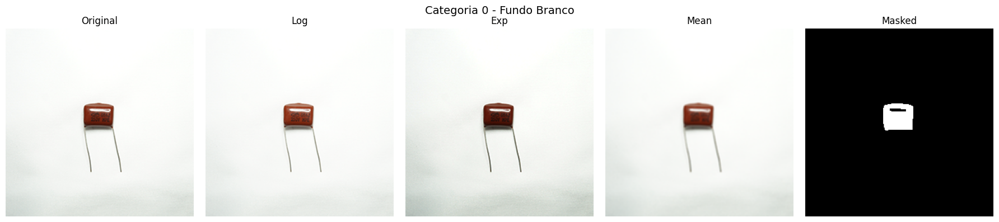

Exibindo imagens para a categoria 00 (Fundo Preto)


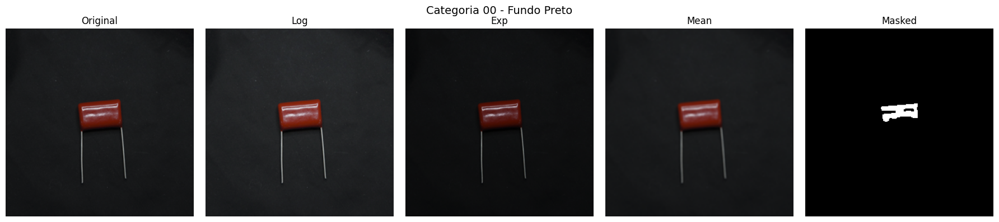

Exibindo imagens para a categoria 01 (Fundo Preto)


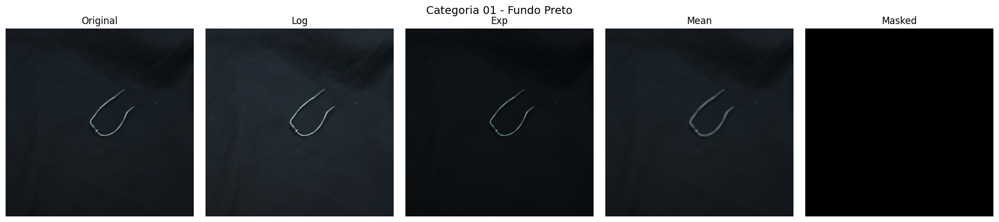

Exibindo imagens para a categoria 02 (Fundo Preto)


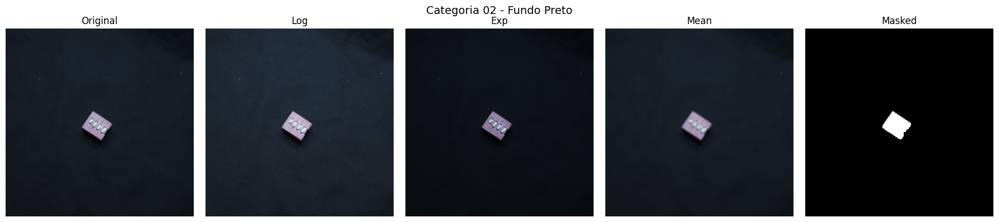

Exibindo imagens para a categoria 03 (Fundo Preto)


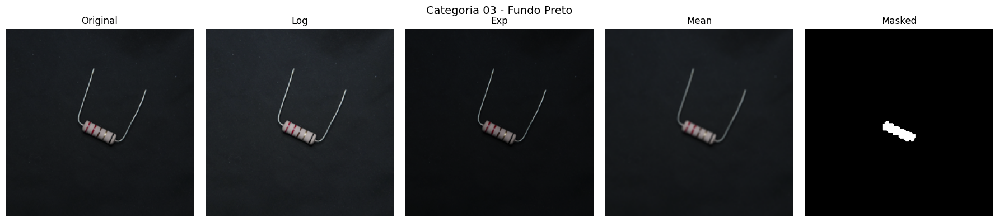

Exibindo imagens para a categoria 04 (Fundo Preto)


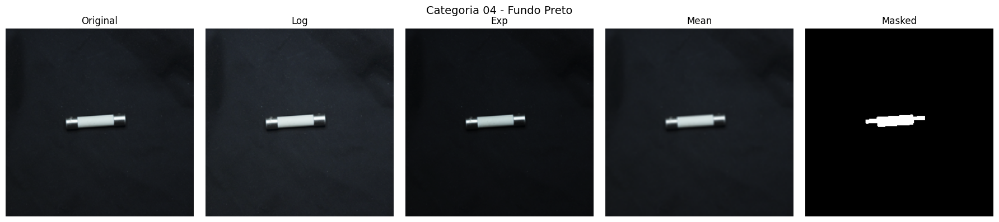

Exibindo imagens para a categoria 05 (Fundo Preto)


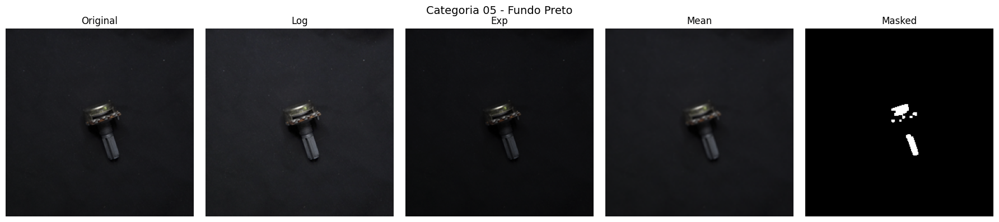

Exibindo imagens para a categoria 06 (Fundo Preto)


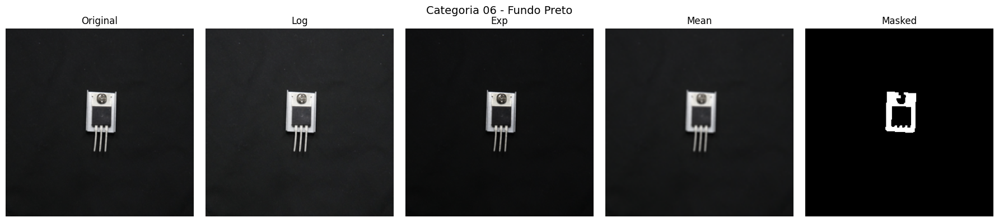

Exibindo imagens para a categoria 07 (Fundo Preto)


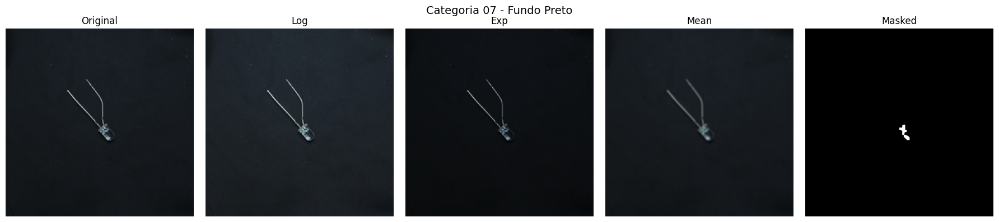

Exibindo imagens para a categoria 08 (Fundo Preto)


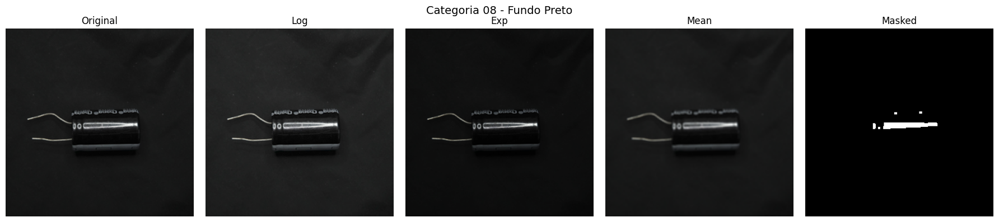

Exibindo imagens para a categoria 09 (Fundo Preto)


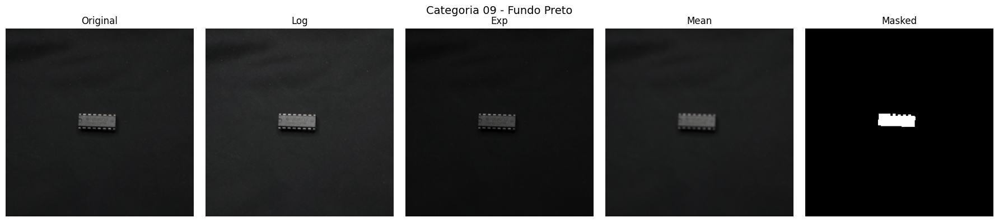

Exibindo imagens para a categoria 1 (Fundo Branco)


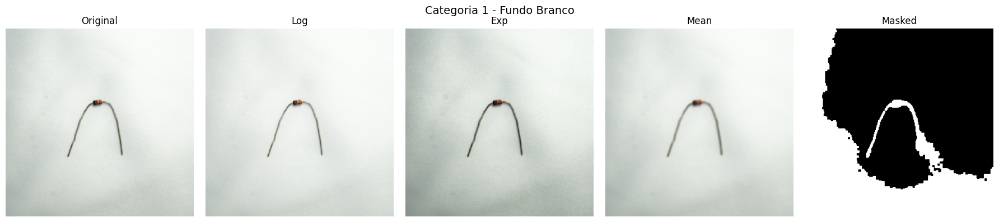

Exibindo imagens para a categoria 2 (Fundo Branco)


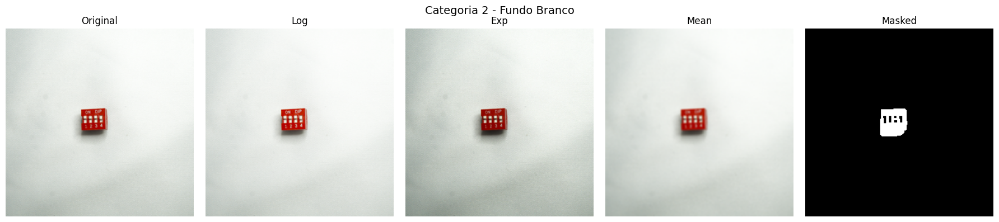

Exibindo imagens para a categoria 3 (Fundo Branco)


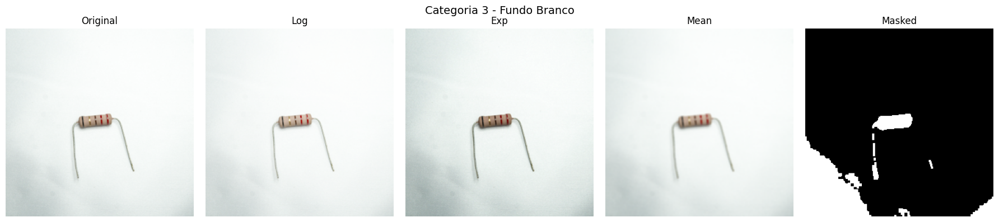

Exibindo imagens para a categoria 4 (Fundo Branco)


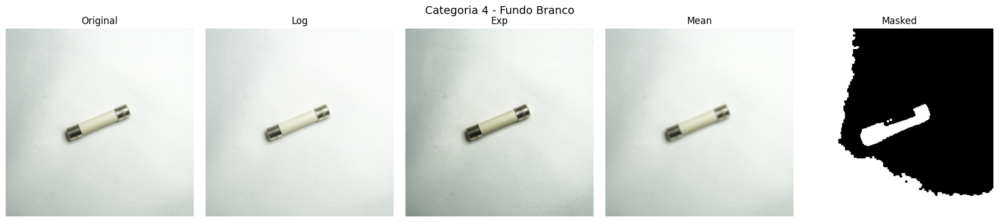

Exibindo imagens para a categoria 5 (Fundo Branco)


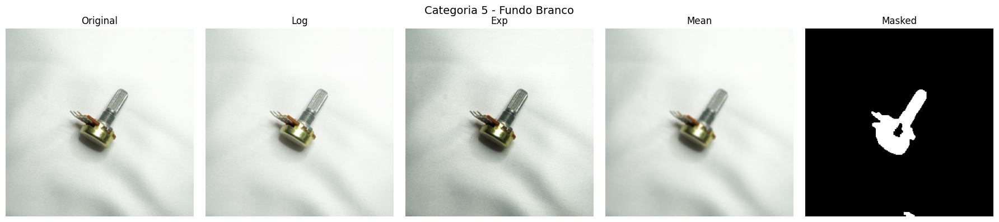

Exibindo imagens para a categoria 6 (Fundo Branco)


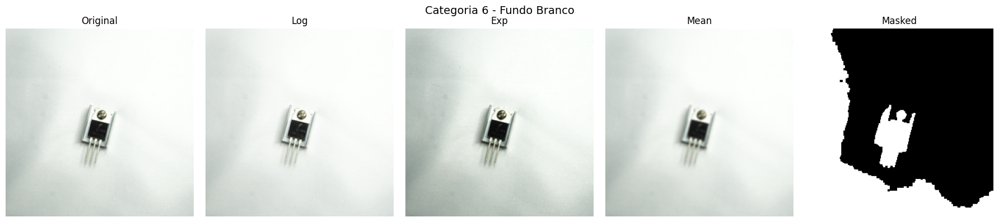

Exibindo imagens para a categoria 7 (Fundo Branco)


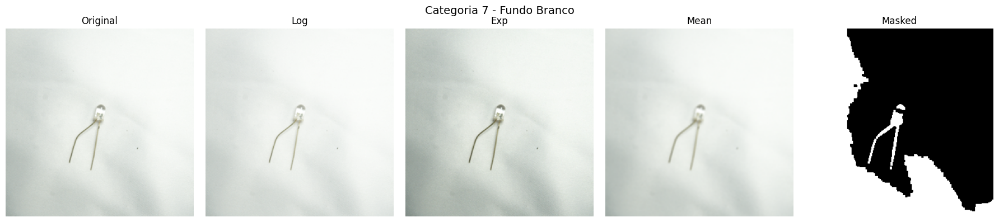

Exibindo imagens para a categoria 8 (Fundo Branco)


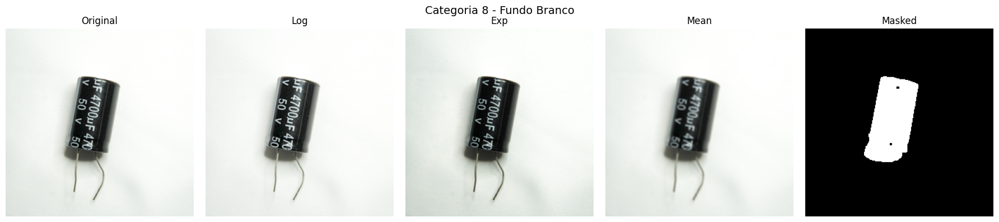

Exibindo imagens para a categoria 9 (Fundo Branco)


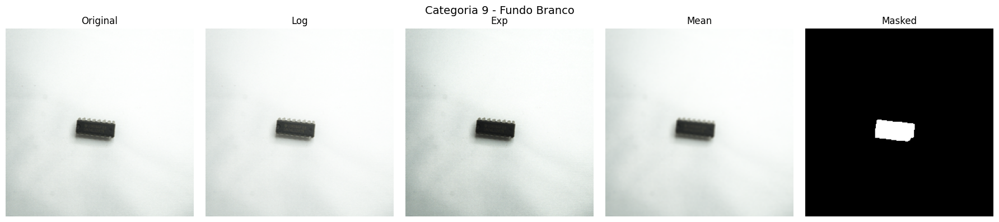

In [32]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_image_set(original_file, folder_images, folder_aug, folder_mask, title=""):

    # Caminho da imagem original
    path_original = os.path.join(folder_images, original_file)

    # A base do nome é a parte do filename sem extensão.
    base_name = os.path.splitext(original_file)[0]

    # Caminhos para as transformações
    path_log = os.path.join(folder_aug, base_name + "_log.png")
    path_exp = os.path.join(folder_aug, base_name + "_exp.png")
    path_mean = os.path.join(folder_aug, base_name + "_mean.png")

    # Caminho para a máscara
    path_mask = os.path.join(folder_mask, base_name + "_mask.png")

    # Carrega as imagens (se o arquivo não existir, a variável será None)
    img_original = mpimg.imread(path_original) if os.path.exists(path_original) else None
    img_log = mpimg.imread(path_log) if os.path.exists(path_log) else None
    img_exp = mpimg.imread(path_exp) if os.path.exists(path_exp) else None
    img_mean = mpimg.imread(path_mean) if os.path.exists(path_mean) else None
    img_mask = mpimg.imread(path_mask) if os.path.exists(path_mask) else None

    # Cria uma figura com 5 subplots (1 linha, 5 colunas)
    fig, axes = plt.subplots(1, 5, figsize=(18, 4))
    fig.suptitle(title, fontsize=14)

    # Exibe a imagem original
    if img_original is not None:
        axes[0].imshow(img_original)
        axes[0].set_title("Original")
    else:
        axes[0].set_title("Original\n(não encontrada)")
    axes[0].axis("off")

    # Exibe a imagem com transformação log
    if img_log is not None:
        axes[1].imshow(img_log)
        axes[1].set_title("Log")
    else:
        axes[1].set_title("Log\n(não encontrada)")
    axes[1].axis("off")

    # Exibe a imagem com transformação exp
    if img_exp is not None:
        axes[2].imshow(img_exp)
        axes[2].set_title("Exp")
    else:
        axes[2].set_title("Exp\n(não encontrada)")
    axes[2].axis("off")

    # Exibe a imagem com transformação mean
    if img_mean is not None:
        axes[3].imshow(img_mean)
        axes[3].set_title("Mean")
    else:
        axes[3].set_title("Mean\n(não encontrada)")
    axes[3].axis("off")

    # Exibe a máscara (imagem binária em escala de cinza)
    if img_mask is not None:
        axes[4].imshow(img_mask, cmap='gray')
        axes[4].set_title("Masked")
    else:
        axes[4].set_title("Masked\n(não encontrada)")
    axes[4].axis("off")

    plt.tight_layout()
    plt.show()


def mostrar_imagens():

    folder_images = IMAGES_DIR
    folder_aug = AUG_DIR
    folder_mask = MASK_DIR


    white_images = {}  # fundo branco (W)
    black_images = {}  # fundo preto (B)

    # Itera pelos arquivos da pasta "images"
    for file in sorted(os.listdir(folder_images)):
        if file.lower().endswith('.png'):
            # Divide o nome no padrão "<CLASSID>-<IMG_SEQUENCE>-<Vx>-<B/W>.png"
            parts = file.split('-')
            if len(parts) < 4:
                continue
            category = parts[0]
            if file.endswith('-W.png'):
                if category not in white_images:
                    white_images[category] = file
            elif file.endswith('-B.png'):
                if category not in black_images:
                    black_images[category] = file

    # Obtém a lista de categorias (em ordem)
    categorias = sorted(set(list(white_images.keys()) + list(black_images.keys())))

    # Para cada categoria, mostra as imagens de fundo branco e fundo preto
    for cat in categorias:
        if cat in white_images:
            print(f"Exibindo imagens para a categoria {cat} (Fundo Branco)")
            display_image_set(white_images[cat], folder_images, folder_aug, folder_mask,
                              title=f"Categoria {cat} - Fundo Branco")
        if cat in black_images:
            print(f"Exibindo imagens para a categoria {cat} (Fundo Preto)")
            display_image_set(black_images[cat], folder_images, folder_aug, folder_mask,
                              title=f"Categoria {cat} - Fundo Preto")

# Para executar a função, basta chamar:
mostrar_imagens()


#Criação do data_normalization e histogramas

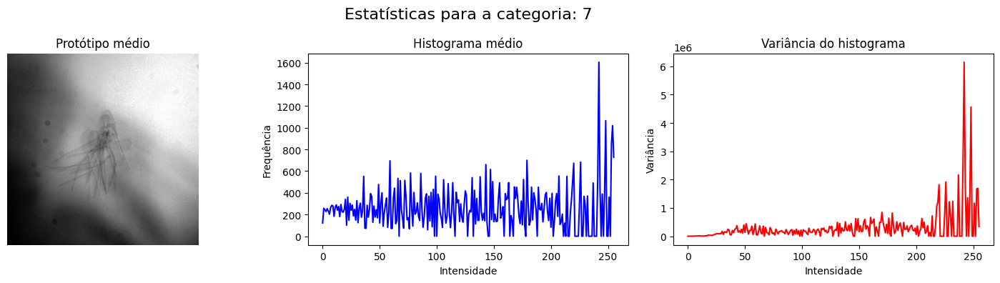

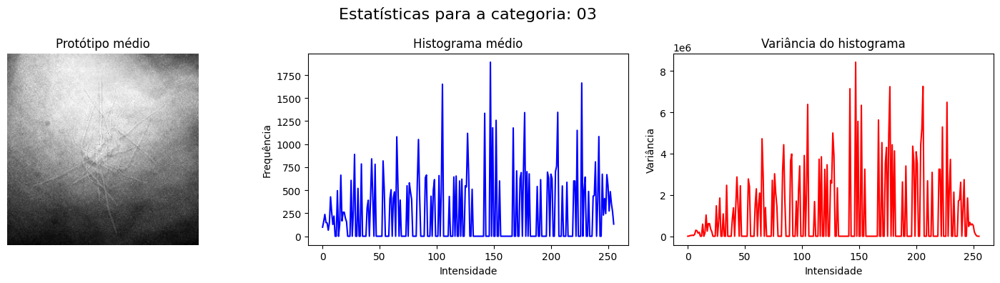

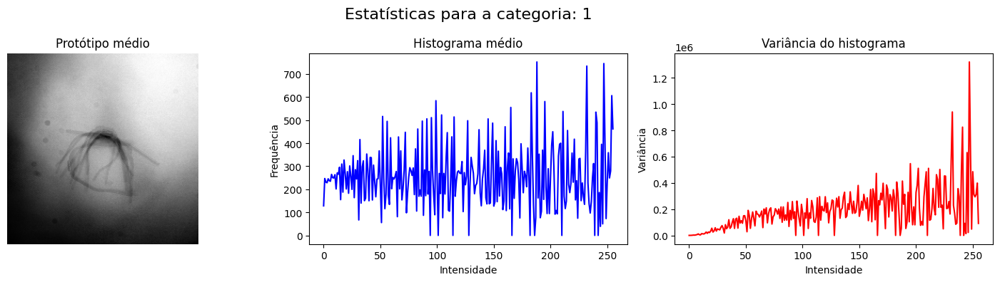

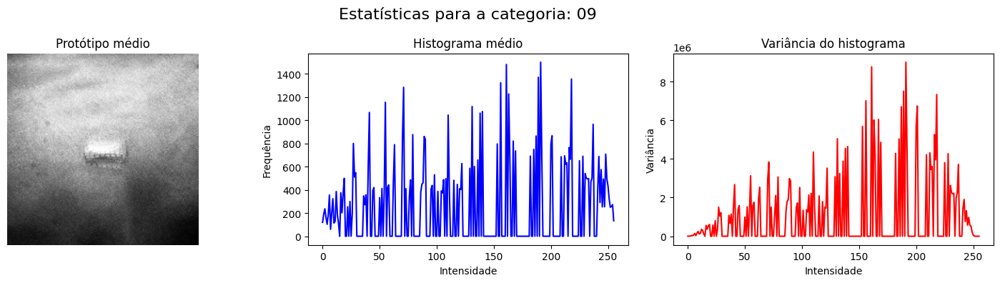

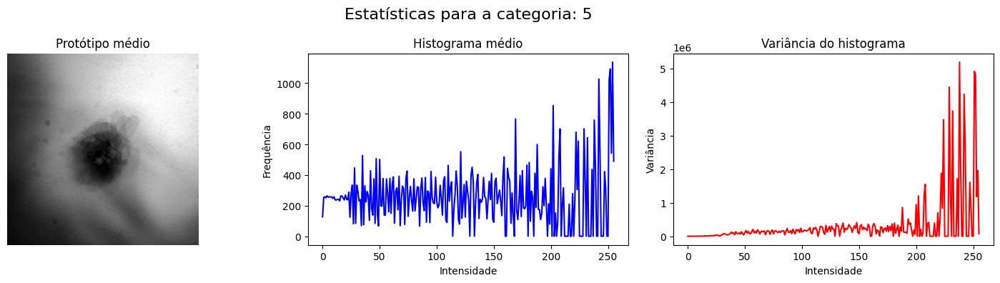

...

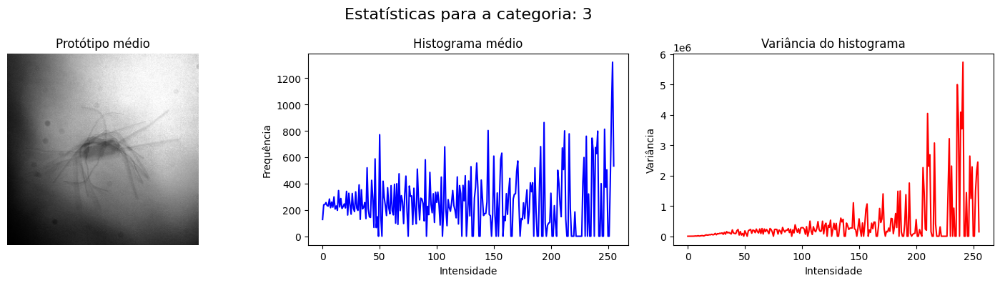

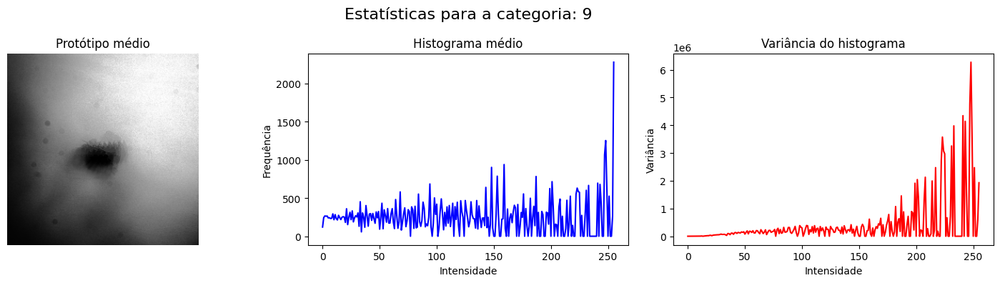

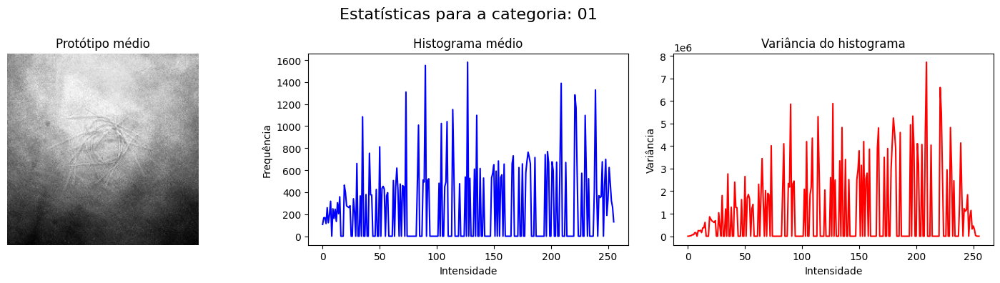

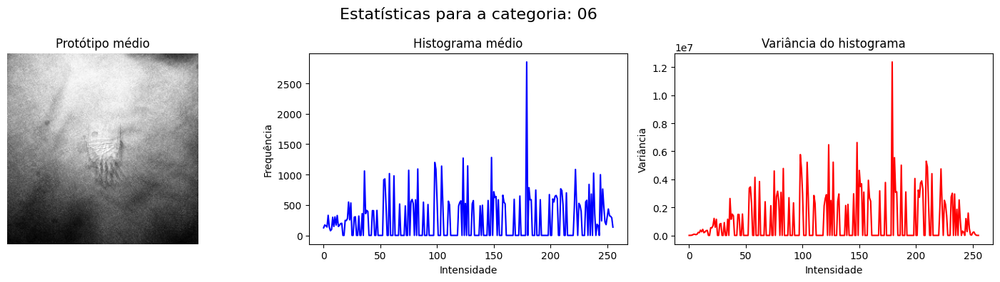

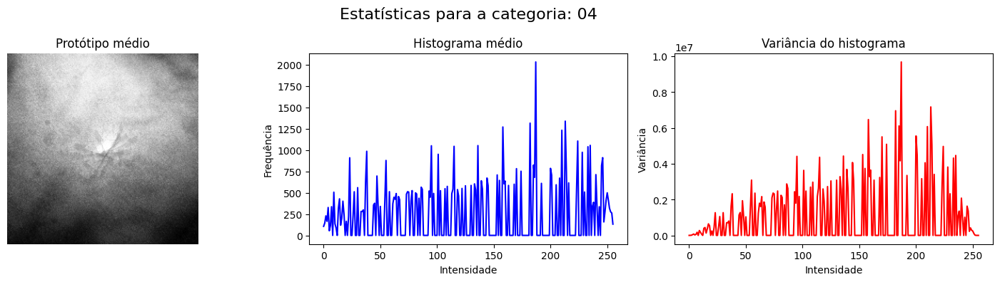

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def normalize_dataset(input_folder=IMAGES_DIR, output_folder=NORM_DIR):

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    images_by_category = {}

    # Itera sobre as imagens originais
    for filename in os.listdir(input_folder):
        if filename.lower().endswith('.png'):
            # Supõe que o nome é: X_classe_number.png (ex.: b_apple_01.png)
            parts = filename.split('-')
            if len(parts) < 3:
                continue
            category = parts[0]

            # Leitura da imagem
            img_path = os.path.join(input_folder, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            # Converte para escala de cinza
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            # Aplica equalização de histogramas
            norm_img = cv2.equalizeHist(gray)

            # Salva a imagem normalizada na pasta de saída
            norm_filename = filename.rsplit('.', 1)[0] + '_norm.png'
            cv2.imwrite(os.path.join(output_folder, norm_filename), norm_img)

            # Armazena a imagem normalizada no dicionário por categoria
            images_by_category.setdefault(category, []).append(norm_img)

    return images_by_category

def compute_statistics(images_by_category):
    """
    Para cada categoria (classe):
    - Calcula o protótipo médio (média pixel a pixel de todas as imagens da categoria).
    - Calcula o histograma de cada imagem (256 bins para intensidades de 0 a 255).
    - Calcula o histograma médio e a variância do histograma (por bin) para a categoria.

    Retorna um dicionário com a tupla (protótipo, histograma médio, variância do histograma) para cada categoria.
    """
    stats = {}

    for category, images in images_by_category.items():
        # Converte as imagens para float32 para realizar a média
        image_stack = np.stack([img.astype(np.float32) for img in images], axis=0)
        prototype = np.mean(image_stack, axis=0)

        # Calcula os histogramas de cada imagem
        hist_list = []
        for img in images:
            # cv2.calcHist retorna um vetor coluna; usamos flatten() para transformar em array 1D
            hist = cv2.calcHist([img], [0], None, [256], [0,256])
            hist_list.append(hist.flatten())
        hist_stack = np.stack(hist_list, axis=0)

        avg_hist = np.mean(hist_stack, axis=0)
        var_hist = np.var(hist_stack, axis=0)

        stats[category] = (prototype, avg_hist, var_hist)

    return stats

def display_normalization_statistics(stats):
    """
    Para cada categoria, exibe:
    - O protótipo médio (imagem média)
    - O histograma médio (linha azul)
    - A variância do histograma (linha vermelha)
    """
    for category, (prototype, avg_hist, var_hist) in stats.items():
        plt.figure(figsize=(15,4))
        plt.suptitle(f"Estatísticas para a categoria: {category}", fontsize=16)

        # Protótipo médio
        plt.subplot(1,3,1)
        plt.imshow(prototype, cmap='gray')
        plt.title("Protótipo médio")
        plt.axis('off')

        # Histograma médio
        plt.subplot(1,3,2)
        plt.plot(avg_hist, color='blue')
        plt.title("Histograma médio")
        plt.xlabel("Intensidade")
        plt.ylabel("Frequência")

        # Variância do histograma
        plt.subplot(1,3,3)
        plt.plot(var_hist, color='red')
        plt.title("Variância do histograma")
        plt.xlabel("Intensidade")
        plt.ylabel("Variância")

        plt.tight_layout()
        plt.show()


# Cria o normalized_dataset e organiza as imagens normalizadas por categoria
images_by_category = normalize_dataset()

# Calcula as estatísticas para cada categoria
stats = compute_statistics(images_by_category)

# Exibe os resultados: protótipo médio, histograma médio e variância do histograma para cada classe
display_normalization_statistics(stats)


#Segmentation

In [ ]:
import os
import cv2
import numpy as np

def generate_masks(input_folder=IMAGES_DIR, output_folder=MASK_DIR):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Itera sobre cada imagem na pasta de entrada
    for filename in os.listdir(input_folder):
        if filename.lower().endswith('.png'):
            input_path = os.path.join(input_folder, filename)
            image = cv2.imread(input_path)

            if image is None:
                print(f"Erro ao ler a imagem: {input_path}")
                continue

            # Converte para escala de cinza
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Aplica limiarização com Otsu para gerar a máscara binária
            ret, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Aplica operações morfológicas para limpar a máscara (remoção de ruídos)
            kernel = np.ones((3, 3), np.uint8)
            mask_cleaned = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
            mask_cleaned = cv2.morphologyEx(mask_cleaned, cv2.MORPH_CLOSE, kernel)

            # Verifica se o nome da imagem indica fundo branco (por exemplo, termina com '-W')
            base_name = os.path.splitext(filename)[0]
            if base_name.endswith("-W"):
                mask_cleaned = cv2.bitwise_not(mask_cleaned)

            # Define o nome do arquivo de saída, adicionando o sufixo '_mask'
            output_filename = f"{base_name}_mask.png"
            output_path = os.path.join(output_folder, output_filename)

            # Salva a máscara
            cv2.imwrite(output_path, mask_cleaned)
            print(f"Salvo: {output_path}")

generate_masks()


#Pré-processamento e preparação de dados para treinamento de um modelo



1.   Recorte da região de interesse de cada imagem com bounding box
2.   Extração de rótulos



In [26]:
import json
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import (Input, Dense, Dropout, Concatenate, Lambda,
                                     Conv2D, MaxPooling2D, GlobalAveragePooling2D)
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import seaborn as sns

# ============================
# Parâmetros e caminhos
# ============================
IMG_SIZE = (256, 256)  # Tamanho das imagens
n_classes = 10         # Exemplo: classes de 0 a 9


folder_images = IMAGES_DIR
folder_aug    = AUG_DIR
folder_mask   = MASK_DIR
folder_gray   = NORM_DIR
json_path     = BOUNDING_BOX_DIR

# ============================
# 1. Carregamento das Bounding Boxes
# ============================
with open(json_path, 'r') as f:
    coco_data = json.load(f)

# Mapeia image_id para file_name
id_to_file = {img["id"]: img["file_name"] for img in coco_data["images"]}

# Cria um dicionário: file_name -> bounding box (usa a primeira box encontrada)
file_to_bbox = {}
for ann in coco_data["annotations"]:
    image_id = ann["image_id"]
    bbox = ann["bbox"]  # Formato: [x, y, width, height]
    file_name = id_to_file.get(image_id)
    if file_name and file_name not in file_to_bbox:
        file_to_bbox[file_name] = bbox

# ============================
# 2. Carregamento e Pré-processamento dos Dados
# ============================
file_list = [f for f in os.listdir(folder_images) if f.lower().endswith('.png')]



X_orig_list     = []  # Imagem original (RGB)
X_aug_list      = []  # Imagem de augmentation (RGB)
X_mask_list     = []  # Máscara (grayscale, 1 canal)
X_gray_list     = []  # Imagem grayscale (1 canal)
X_aug_exp_list  = []  # Imagem de augmentation extra (RGB)
X_aug_mean_list = []  # Imagem de augmentation média (RGB)
labels          = []  # Rótulos (extraídos do nome, ex: "0-...")

for file in file_list:
    #print(file)
    # --- Imagem original ---
    path_orig = os.path.join(folder_images, file)
    img_orig = load_img(path_orig)
    img_orig = img_to_array(img_orig)
    bbox = file_to_bbox.get(file, None)
    if bbox:
        x, y, w, h = map(int, bbox)
        img_orig = img_orig[y:y+h, x:x+w, :]  # Recorta a ROI
    img_orig = tf.image.resize(img_orig, IMG_SIZE).numpy()

    # --- Imagem de augmentation (log) ---
    path_aug = os.path.join(folder_aug, file.replace('.png', '_log.png'))
    if os.path.exists(path_aug):
        img_aug = load_img(path_aug)
        img_aug = img_to_array(img_aug)
    else:
        img_aug = np.zeros((IMG_SIZE[0], IMG_SIZE[1], 3))
    img_aug = tf.image.resize(img_aug, IMG_SIZE).numpy()

    # --- Imagem de augmentation (exp) ---
    path_aug_exp = os.path.join(folder_aug, file.replace('.png', '_exp.png'))
    if os.path.exists(path_aug_exp):
        img_aug_exp = load_img(path_aug_exp)
        img_aug_exp = img_to_array(img_aug_exp)
    else:
        img_aug_exp = np.zeros((IMG_SIZE[0], IMG_SIZE[1], 3))
    img_aug_exp = tf.image.resize(img_aug_exp, IMG_SIZE).numpy()

    # --- Imagem de augmentation (mean) ---
    path_aug_mean = os.path.join(folder_aug, file.replace('.png', '_mean.png'))
    if os.path.exists(path_aug_mean):
        img_aug_mean = load_img(path_aug_mean)
        img_aug_mean = img_to_array(img_aug_mean)
    else:
        img_aug_mean = np.zeros((IMG_SIZE[0], IMG_SIZE[1], 3))
    img_aug_mean = tf.image.resize(img_aug_mean, IMG_SIZE).numpy()

    # --- Máscara (grayscale) ---
    path_mask = os.path.join(folder_mask, file.replace(".png", "_mask.png"))
    if os.path.exists(path_mask):
        img_mask = load_img(path_mask, color_mode='grayscale')
        img_mask = img_to_array(img_mask)
    else:
        img_mask = np.zeros((IMG_SIZE[0], IMG_SIZE[1], 1))
    img_mask = tf.image.resize(img_mask, IMG_SIZE).numpy()

    # --- Imagem grayscale ---
    path_gray = os.path.join(folder_gray, file.replace(".png", "_norm.png"))
    if os.path.exists(path_gray):
        img_gray = load_img(path_gray, color_mode='grayscale')
        img_gray = img_to_array(img_gray)
    else:
        img_gray = np.zeros((IMG_SIZE[0], IMG_SIZE[1], 1))
    img_gray = tf.image.resize(img_gray, IMG_SIZE).numpy()

    # Armazena as imagens
    X_orig_list.append(img_orig)
    X_aug_list.append(img_aug)
    X_mask_list.append(img_mask)
    X_gray_list.append(img_gray)
    X_aug_exp_list.append(img_aug_exp)
    X_aug_mean_list.append(img_aug_mean)

    # Extrai rótulo (ex: "0-..." -> 0)
    try:
        label = int(file.split('-')[0])
    except:
        label = 0
    labels.append(label)

# Converte listas para arrays numpy
X_orig     = np.array(X_orig_list)
X_aug      = np.array(X_aug_list)
X_mask     = np.array(X_mask_list)
X_gray     = np.array(X_gray_list)
X_aug_exp  = np.array(X_aug_exp_list)
X_aug_mean = np.array(X_aug_mean_list)
labels     = np.array(labels)


#Divisão dos dados

In [27]:
print("Total de amostras:", X_orig.shape[0])

# ============================
# 3. Divisão dos Dados (Treino, Validação, Teste)
# ============================
# Separa 80% para treino e 20% para um conjunto temporário
X_orig_train, X_orig_temp, \
X_aug_train, X_aug_temp, \
X_mask_train, X_mask_temp, \
X_gray_train, X_gray_temp, \
X_aug_mean_train, X_aug_mean_temp, \
X_aug_exp_train, X_aug_exp_temp, \
y_train, y_temp = train_test_split(
    X_orig, X_aug, X_mask, X_gray, X_aug_mean, X_aug_exp, labels,
    test_size=0.2, random_state=42, stratify=labels
)

# Divide os 20% restantes em 50% validação e 50% teste
X_orig_val, X_orig_test, \
X_aug_val, X_aug_test, \
X_mask_val, X_mask_test, \
X_gray_val, X_gray_test, \
X_aug_mean_val, X_aug_mean_test, \
X_aug_exp_val, X_aug_exp_test, \
y_val, y_test = train_test_split(
    X_orig_temp, X_aug_temp, X_mask_temp, X_gray_temp, X_aug_mean_temp, X_aug_exp_temp, y_temp,
    test_size=0.5, random_state=42, stratify=y_temp
)

print("Treino:", X_orig_train.shape[0])
print("Validação:", X_orig_val.shape[0])
print("Teste:", X_orig_test.shape[0])

Total de amostras: 200
Treino: 160
Validação: 20
Teste: 20


#Criação do modelo de CNN e extração Features

In [16]:
# ============================
# 4. Definição do Modelo
# ============================
# Função para criar um modelo CNN
def build_cnn(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = GlobalAveragePooling2D()(x)
    model = Model(inputs, x, name="custom_cnn")
    return model

# Camada de normalização (divisão por 255)
norm_layer = Lambda(lambda x: x / 255.0)

# Função para replicar canal (de grayscale para RGB)
def replicate_channels(x):
    return tf.image.grayscale_to_rgb(x)

# Definição dos inputs
input_orig     = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3), name='input_orig')
input_aug      = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3), name='input_aug')
input_mask     = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 1), name='input_mask')
input_gray     = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 1), name='input_gray')
input_aug_exp  = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3), name='input_aug_exp')
input_aug_mean = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3), name='input_aug_mean')

# Aplicando normalização para inputs de 3 canais
norm_orig     = norm_layer(input_orig)
norm_aug      = norm_layer(input_aug)
norm_aug_exp  = norm_layer(input_aug_exp)
norm_aug_mean = norm_layer(input_aug_mean)

# Para inputs de 1 canal, converte para 3 canais e normaliza
mask_rgb = Lambda(replicate_channels)(input_mask)
gray_rgb = Lambda(replicate_channels)(input_gray)
norm_mask = norm_layer(mask_rgb)
norm_gray = norm_layer(gray_rgb)

# Cria o backbone customizado
backbone = build_cnn((IMG_SIZE[0], IMG_SIZE[1], 3))

# Extração de features
features_orig     = backbone(norm_orig)
features_aug      = backbone(norm_aug)
features_mask     = backbone(norm_mask)
features_gray     = backbone(norm_gray)
features_aug_exp  = backbone(norm_aug_exp)
features_aug_mean = backbone(norm_aug_mean)

# Concatena as features dos diferentes ramos
merged_features = Concatenate()([
    features_orig, features_aug, features_mask,
    features_gray, features_aug_exp, features_aug_mean
])

# Camadas densas para classificação
x = Dense(256, activation='relu')(merged_features)
x = Dropout(0.5)(x)
output = Dense(n_classes, activation='softmax')(x)

# Definição e compilação do modelo
model = Model(
    inputs=[input_orig, input_aug, input_mask, input_gray, input_aug_exp, input_aug_mean],
    outputs=output
)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_mask (InputLayer)   │ (None, 256, 256, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_gray (InputLayer)   │ (None, 256, 256, 1)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_orig (InputLayer)   │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_aug (InputLayer)    │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_7 (Lambda)         │ (None, 256, 256, 3)    │              0 │ input_mask[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_8 (Lambda)         │ (None, 256, 256, 3)    │              0 │ input_gray[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_aug_exp             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_aug_mean            │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_6 (Lambda)         │ (None, 256, 256, 3)    │              0 │ input_orig[0][0],      │
│                           │                        │                │ input_aug[0][0],       │
│                           │                        │                │ input_aug_exp[0][0],   │
│                           │                        │                │ input_aug_mean[0][0],  │
│                           │                        │                │ lambda_7[0][0],        │
│                           │                        │                │ lambda_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_cnn (Functional)   │ (None, 128)            │         93,248 │ lambda_6[0][0],        │
│                           │                        │                │ lambda_6[1][0],        │
│                           │                        │                │ lambda_6[4][0],        │
│                           │                        │                │ lambda_6[5][0],        │
│                           │                        │                │ lambda_6[2][0],        │
│                           │                        │                │ lambda_6[3][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 768)            │              0 │ custom_cnn[0][0],      │
│ (Concatenate)             │                        │                │ custom_cnn[1][0],      │
│                           │                        │                │ custom_cnn[2][0],      │
│                           │                        │                │ custom_cnn[3][0],      │
│                           │                        │                │ custom_cnn[4][0],      │
│                           │                        │                │ custom_cnn[5][0]       │
├──────────────────────

 Total params: 292,682 (1.12 MB)

 Trainable params: 292,682 (1.12 MB)

 Non-trainable params: 0 (0.00 B)



#Treinamento do Modelo



Epoch 1/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.9573 - loss: 0.1728 - val_accuracy: 0.6500 - val_loss: 4.2131
Epoch 2/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.5664 - loss: 1.7294 - val_accuracy: 0.6000 - val_loss: 2.2540
Epoch 3/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8221 - loss: 0.5356 - val_accuracy: 0.7000 - val_loss: 1.7696
Epoch 4/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.8811 - loss: 0.3525 - val_accuracy: 0.6500 - val_loss: 3.4077
Epoch 5/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8844 - loss: 0.4482 - val_accuracy: 0.7500 - val_loss: 1.5960
Epoch 6/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9027 - loss: 0.3256 - val_accuracy: 0.7000 - val_loss: 1.8377
Epoch 7/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9406 - loss: 0.2481 - val_accuracy: 0.7500 - val_loss: 1.4237
Epoch 8/40
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9116 - loss: 0.3838 - val_accu

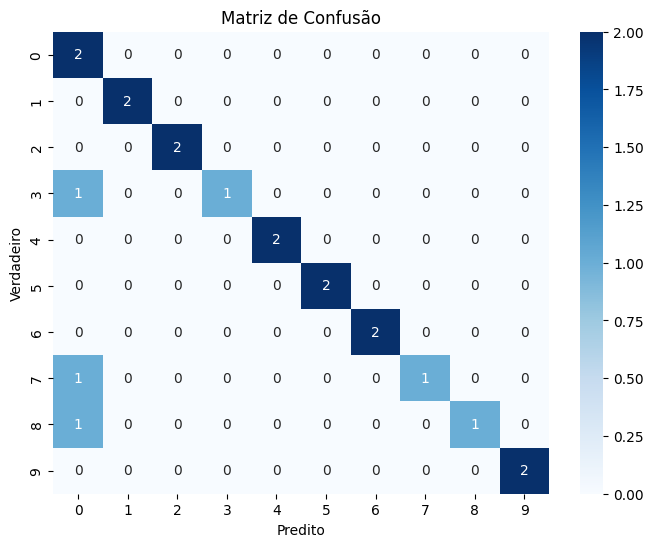

In [23]:
# ============================
# 5. Treinamento do Modelo
# ============================
history = model.fit(
    [X_orig_train, X_aug_train, X_mask_train, X_gray_train, X_aug_exp_train, X_aug_mean_train],
    y_train,
    validation_data=([X_orig_val, X_aug_val, X_mask_val, X_gray_val, X_aug_exp_val, X_aug_mean_val], y_val),
    epochs=40,
    batch_size=1
)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
Acurácia no teste: 0.8500
F1-score (média ponderada): 0.8571


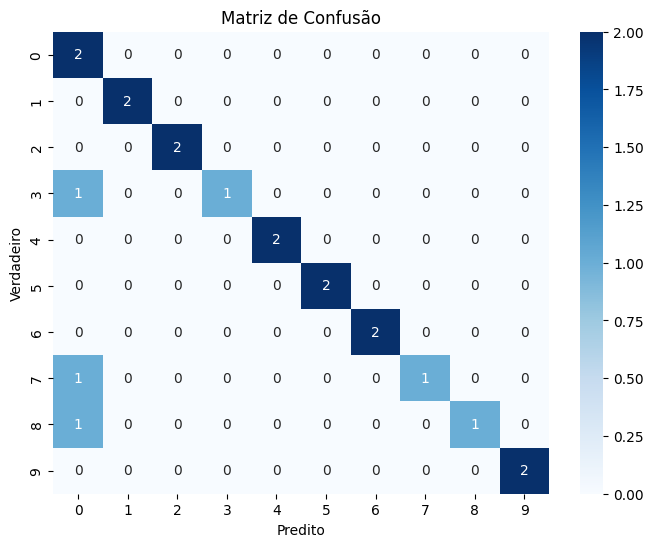

In [28]:
# ============================
# 6. Avaliação e Testes
# ============================
# Previsões no conjunto de teste
y_pred_probs = model.predict([X_orig_test, X_aug_test, X_mask_test, X_gray_test, X_aug_exp_test, X_aug_mean_test])
y_pred = np.argmax(y_pred_probs, axis=1)

# Cálculo das métricas
acc = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
print("Acurácia no teste: {:.4f}".format(acc))
print("F1-score (média ponderada): {:.4f}".format(f1))

# Plot da Matriz de Confusão
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predito')
plt.ylabel('Verdadeiro')
plt.title('Matriz de Confusão')
plt.show()

In [30]:
model.save("/content/drive/MyDrive/pdi/model.h5")

In [31]:
model.save("/content/drive/MyDrive/pdi/model.keras")